# Price Data

Information about the columns:

| Field | Description | Notes | 
| --- | --- | --- | 
| DateValueCET | Day  | yyyy-mm-dd  | 
| TimeValueCET | Hour | hh:mm:ss | 
| PowerPriceAreaCode | Different geographic and hydrological regions in Brazil | Values: BRAZIL_SOUTH, BRAZIL_NORTH, BRAZIL_NORTHEAST, RAZIL_SOUTHEAST_CENTRALWEST |
| PriceMWh | Settlement Price - the trading price that is invoiced for the specific time period | Unit: BRL per MW/h (Brazilian Real per Mega Watt/ hour) |

In [4]:
import pandas as pd 

# Read Price Data Excel file
df_price = pd.read_excel('./data_sources/Price Data.xlsx')

In [6]:
df_price = df_price[['DateValueCET', 'TimeValueCET', 'PowerPriceAreaCode', 'PriceMWh']]
df_price['DateValueCET'] = pd.to_datetime(df_price['DateValueCET'])
df_price['TimeValueCET'] = pd.to_timedelta(df_price['TimeValueCET'])
df_price['DateTime'] = df_price['DateValueCET'] + df_price['TimeValueCET']
display(df_price.head())

,DateValueCET,TimeValueCET,PowerPriceAreaCode,PriceMWh,DateTime
0,2024-09-12,0 days 04:00:00,BRAZIL_NORTH,286.29,2024-09-12 04:00:00
1,2024-09-12,0 days 04:00:00,BRAZIL_NORTHEAST,286.24,2024-09-12 04:00:00
2,2024-09-12,0 days 04:00:00,BRAZIL_SOUTH,286.28,2024-09-12 04:00:00
3,2024-09-12,0 days 04:00:00,BRAZIL_SOUTHEAST_CENTRALWEST,286.28,2024-09-12 04:00:00
4,2024-09-12,0 days 03:00:00,BRAZIL_NORTH,304.05,2024-09-12 03:00:00


In [8]:
# Extract the day of the year (1-365 or 366) and the hour of the day
df_price['day_of_year'] = df_price['DateTime'].dt.dayofyear
df_price['day_of_week'] = df_price['DateTime'].dt.dayofweek
df_price['hour'] = df_price['DateTime'].dt.hour
df_price['year'] = df_price['DateTime'].dt.year

In [43]:
df_price_2024 = df_price[df_price['DateTime'].dt.year == 2024]
df_price_2023 = df_price[df_price['DateTime'].dt.year == 2023]
df_price_2022 = df_price[df_price['DateTime'].dt.year == 2022]
df_price_2021 = df_price[df_price['DateTime'].dt.year == 2021]

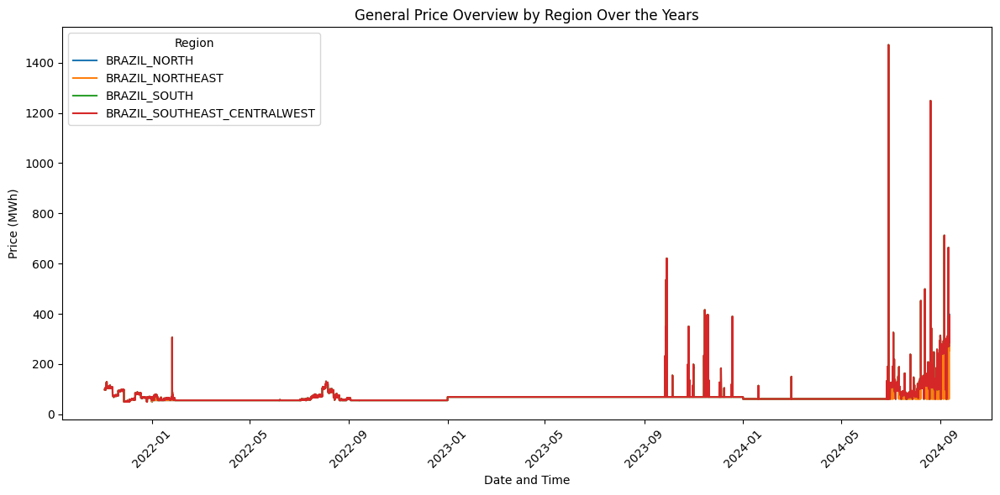

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert DateTime to datetime format if not already done
df_price['DateTime'] = pd.to_datetime(df_price['DateTime'])

# Create a figure
plt.figure(figsize=(12, 6))

# Get unique regions from the PowerPriceAreaCode column
regions = df_price['PowerPriceAreaCode'].unique()

# Plot lines for each region
for region in regions:
    region_data = df_price[df_price['PowerPriceAreaCode'] == region]
    sns.lineplot(data=region_data, x='DateTime', y='PriceMWh', label=region)

# Add titles and labels
plt.title('General Price Overview by Region Over the Years')
plt.xlabel('Date and Time')
plt.ylabel('Price (MWh)')
plt.legend(title='Region')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()

# Show the plot
plt.show()


**- Can we explain the spikes / outliers with domain knowledge?**

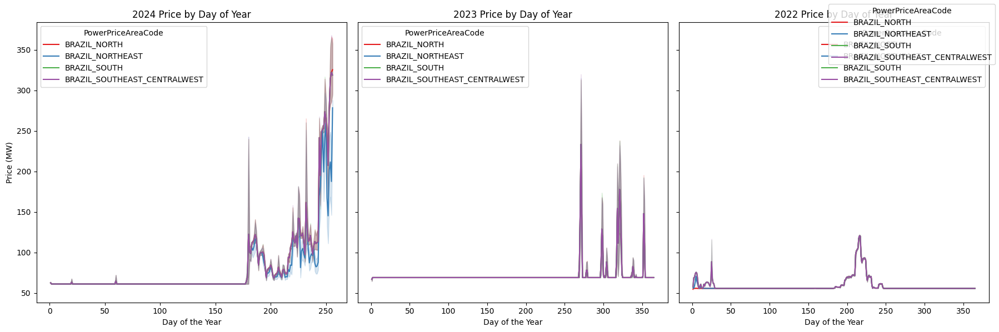

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_line_subplot(ax, df, year):
    # Create line plot with color differentiation for regions
    sns.lineplot(
        ax=ax,
        x='day_of_year', 
        y='PriceMWh', 
        hue='PowerPriceAreaCode', 
        data=df,
        palette='Set1',  # Use distinct colors for regions
        legend=True      # Handle legend outside of the subplot
    )
    ax.set_title(f'{year} Price by Day of Year')
    ax.set_xlabel('Day of the Year')
    ax.set_ylabel('Price (MW)')
    return ax

# Create subplots: 1 row, 3 columns
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Plot line charts for each year
plot_line_subplot(axs[0], df_price_2024, 2024)
plot_line_subplot(axs[1], df_price_2023, 2023)
plot_line_subplot(axs[2], df_price_2022, 2022)

# Adjust layout for better spacing
plt.tight_layout()

# Add one common legend for all plots
handles, labels = axs[0].get_legend_handles_labels()  # Get the handles and labels from the first plot
fig.legend(handles, labels, loc='upper right', title='PowerPriceAreaCode')

# Show the figure
plt.show()


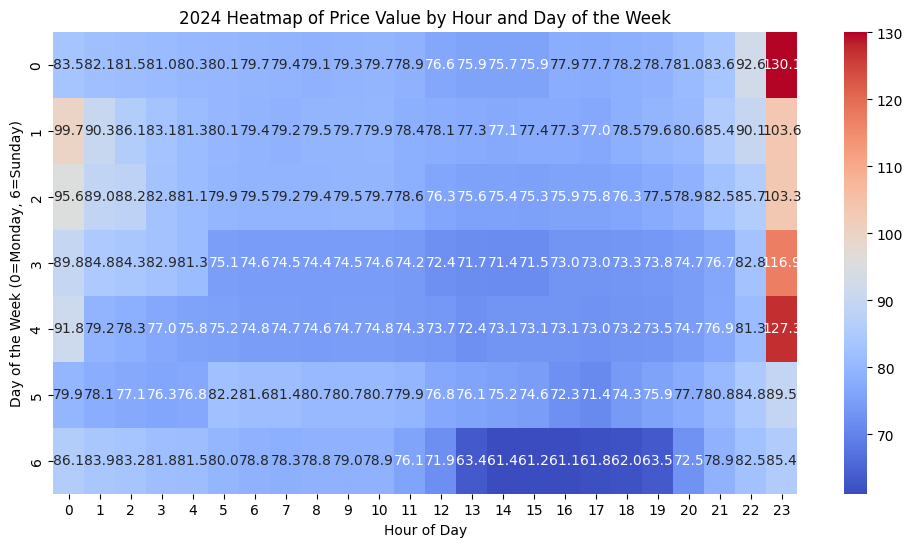

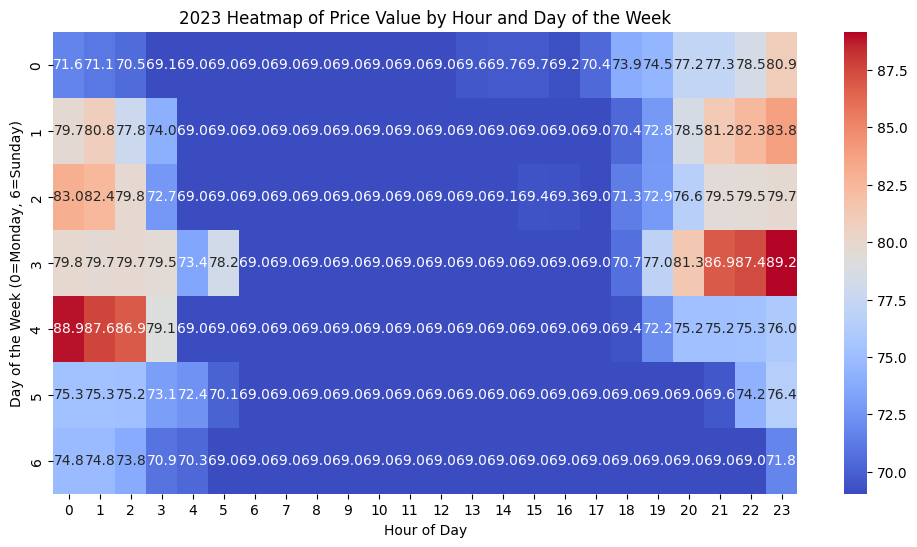

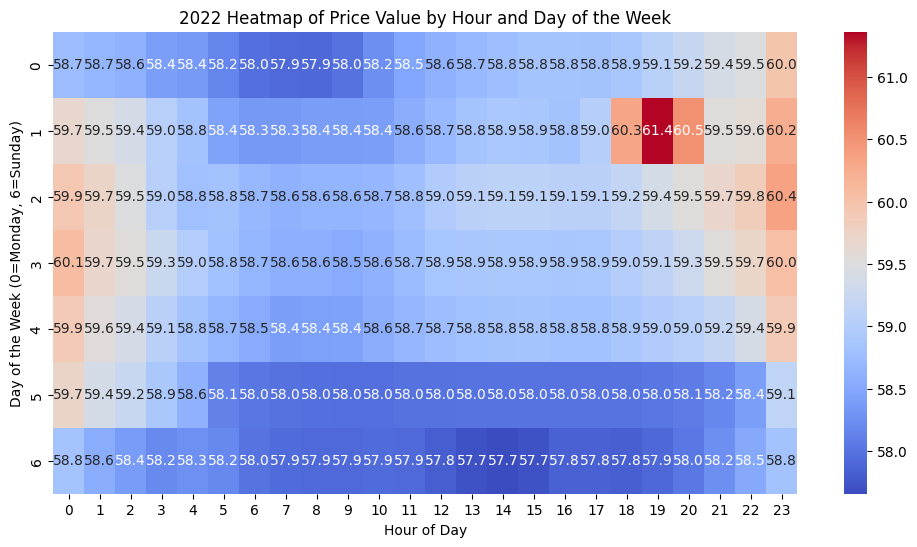

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_heatmap(df, year):
    # Pivot data to create a matrix for heatmap
    heatmap_data = df.pivot_table(index='day_of_week', columns='hour', values='PriceMWh', aggfunc='mean')

    # Plot the heatmap
    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt=".1f")
    plt.title(f'{year} Heatmap of Price Value by Hour and Day of the Week')
    plt.xlabel('Hour of Day')
    plt.ylabel('Day of the Week (0=Monday, 6=Sunday)')
    plt.show()

# Plot heatmaps for each year
plot_heatmap(df_price_2024, 2024)
plot_heatmap(df_price_2023, 2023)
plot_heatmap(df_price_2022, 2022)


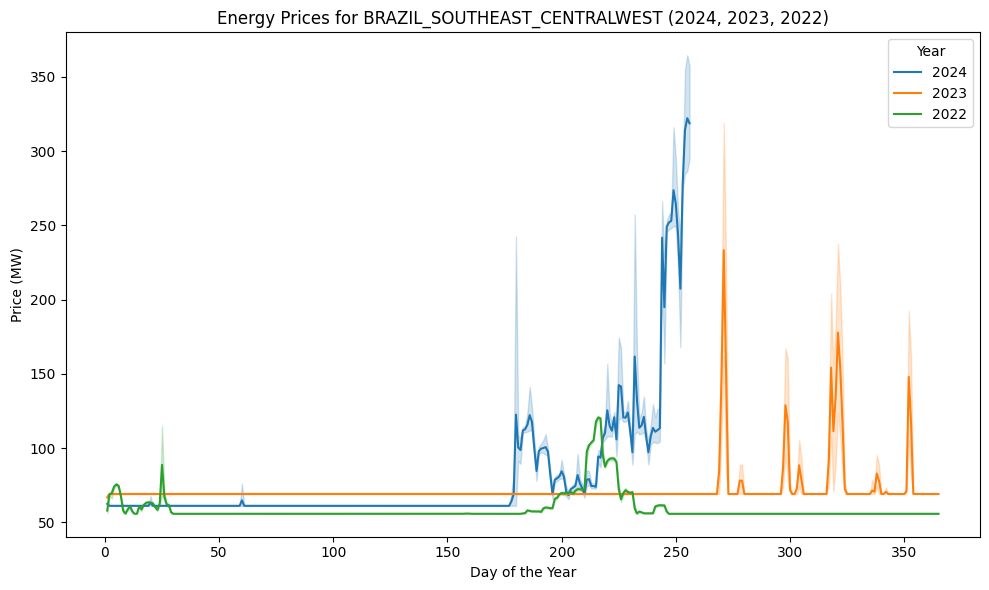

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data for the specific region 'BRAZIL_SOUTHEAST_CENTRALWEST'
region = 'BRAZIL_SOUTHEAST_CENTRALWEST'

df_2024_region = df_price_2024[df_price_2024['PowerPriceAreaCode'] == region]
df_2023_region = df_price_2023[df_price_2023['PowerPriceAreaCode'] == region]
df_2022_region = df_price_2022[df_price_2022['PowerPriceAreaCode'] == region]

# Set up the plot
plt.figure(figsize=(10, 6))

# Plot line charts for each year, focusing on BRAZIL_SOUTHEAST_CENTRALWEST
sns.lineplot(data=df_2024_region, x='day_of_year', y='PriceMWh', label='2024')
sns.lineplot(data=df_2023_region, x='day_of_year', y='PriceMWh', label='2023')
sns.lineplot(data=df_2022_region, x='day_of_year', y='PriceMWh', label='2022')

# Add titles and labels
plt.title(f"Energy Prices for {region} (2024, 2023, 2022)")
plt.xlabel('Day of the Year')
plt.ylabel('Price (MW)')

# Display the legend and the plot
plt.legend(title='Year')
plt.tight_layout()

plt.show()


We have to be careful making assumptions about day/night consumption as we need to confirm time zone.

In [47]:
import plotly.express as px

fig = px.scatter(
    df_price, 
    x='hour', 
    y='PriceMWh',  # Use your actual energy load column here
    color='year',  # # Color by year to differentiate the years 
    facet_col='PowerPriceAreaCode',  # Create a subplot for each region (PowerPriceAreaCode)
    animation_frame='day_of_year',  # This allows us to animate the graph by each hour of the day
    title="Price by Day of Year and Hour",
    labels={'day_of_year': 'Day of the Year', 'PriceMWh': 'Price (MW)'},
    hover_data=['DateTime', 'hour'],  # Add extra info to hover
    width=1500,  # Custom width
    height=800
)

# Show the plot
fig.show()